In [1]:
import pandas as pd
import matplotlib.pyplot as plt
from mpl_toolkits import mplot3d
import numpy as np
import cmocean
import warnings
from matplotlib import rcParams
from mpl_toolkits.axes_grid1 import make_axes_locatable
import seawater as sw
from scipy import stats
warnings.filterwarnings('ignore')

## Read in the data

In [2]:
#Pickled acoustic data
df1022 = pd.read_pickle('processingFiles/df1022.pkl')
df1023 = pd.read_pickle('processingFiles/df1023.pkl')
dfMLS1 = pd.read_pickle('processingFiles/dfMLS1.pkl')
dfMLS2 = pd.read_pickle('processingFiles/dfMLS2.pkl')
dfMLS3 = pd.read_pickle('processingFiles/dfMLS3.pkl')
dfMLS4 = pd.read_pickle('processingFiles/dfMLS4.pkl')
# ENV data files
dfEnv1022 = pd.read_csv('../../../data/Env/processed/Env1022.csv')
dfEnv1022.dtime = pd.to_datetime(dfEnv1022.dtime)
dfEnv1023 = pd.read_csv('../../../data/Env/processed/Env1023.csv')
dfEnv1023.dtime = pd.to_datetime(dfEnv1023.dtime)

In [3]:
def combineEnvAcoustic(dfEnv, dfAcoustic):
    dfEnv.dtime = pd.to_datetime(dfEnv.dtime)
    dfEnv = dfEnv.sort_values('dtime')
    dfEnv = dfEnv.set_index('dtime')

    dfAcoustic = dfAcoustic.sort_values('datetime')
    dfAcoustic = dfAcoustic.set_index('datetime')

    df = dfEnv.reindex(dfAcoustic.index, method='nearest')
    df = df.merge(dfAcoustic,on='datetime')
    return df

In [4]:
df1022All= combineEnvAcoustic(dfEnv1022, df1022)
df1023All= combineEnvAcoustic(dfEnv1023, df1023)
dfSurvey1All = df1022All[(df1022All.index > '07-20-2018') & (df1022All.index < '08-21-2018') ]
dfSurvey1All.name = 'First Complete Survey'

df1023CS2 = df1023All[(df1023All.index > '08-24-2018 15:00:00') & (df1023All.index < '09-07-2018')]
df1022CS2 = df1022All[(df1022All.index > '08-25-2018') & (df1022All.index < '09-11-2018 22:00:00') ]
dfSurvey2All = pd.concat([df1023CS2, df1022CS2])
dfSurvey2All.name = 'Second Complete Survey'

In [5]:
allData = pd.concat([dfSurvey2All,dfSurvey1All])
allData[(allData.tempCTD > 6) & (allData.sal > 29)].nasc.sum()/allData.nasc.sum()
display(allData.tempCTD.min(),allData.tempCTD.max(),allData.sal.resample('10T').min(),allData.sal.max()) # print the min/max temp and salinity from the "real" values

-0.7390000000000001

11.588

datetime
2018-07-20 00:00:00    31.339
2018-07-20 00:10:00    31.436
2018-07-20 00:20:00    31.525
2018-07-20 00:30:00    31.741
2018-07-20 00:40:00    31.830
                        ...  
2018-09-11 21:10:00    31.508
2018-09-11 21:20:00    31.506
2018-09-11 21:30:00    31.478
2018-09-11 21:40:00    31.479
2018-09-11 21:50:00    31.503
Freq: 10T, Name: sal, Length: 7764, dtype: float64

32.85

In [9]:
rcParams.update({'font.size': 15})
figure = plt.figure(figsize=(6,5), dpi=1200)
ax1 = plt.subplot(1,2,1)
c = plt.cm.plasma(np.log10(allData.nasc.resample('10T').mean())/3)
scat2 = ax1.scatter(allData.sal.resample('10T').mean(),allData.tempCTD.resample('10T').mean(),
           s = 10,edgecolors=c,linewidth=.5,facecolors=c,cmap='plasma',vmin=0, vmax=3,zorder=2)
#c = plt.cm.viridis(np.log10(allData.nasc.values)/3)
#scat2 = ax1.scatter(allData.sal.values,allData.tempCTD.values,
#            s = 10,facecolors=c,edgecolors = c,vmin=0, vmax=3,linewidth =.5,zorder=2)

x = np.linspace(25,35,50)
y = np.linspace(-1,14,50)
X, Y = np.meshgrid(x, y)
Z = sw.eos80.dens0(X, Y)
contours=ax1.contour(X, Y, Z, colors='grey',zorder=0);
#ax1.clabel(contours, inline=True, fontsize=8)
ax1.set_xlim([26,34])
ax1.set_ylim([-1,13])
ax1.set_ylabel('Temperature ($\circ$C)')
ax1.set_xlabel('Salinity (PSS-78)')

#ax2 = plt.subplot(1,2,2)
#ax2.grid(zorder=1)
#scat2 = ax2.scatter(df1023All.sal.resample('.5H').mean(),df1023All.tempCTD.resample('.5H').mean(),
#            s = np.log10(df1023All.nasc.resample('.5H').mean())**6,c = np.log10(df1023All.nasc.resample('.5H').mean()),alpha=1,facecolors='none',cmap='viridis',vmin=0, vmax=3,zorder=2)
#ax2.set_xlim([24,33])
#ax2.set_ylim([-1,13])
#ax2.set_yticklabels([])
#ax2.set_xlabel('Salinity')
#divider = make_axes_locatable(ax2)
#cax = divider.append_axes("right", size="5%", pad=0.05)
#cbar=plt.colorbar(scat2, cax=cax)
#cbar.set_label('log$_{10}$(s$_{A}$)')
#plt.subplots_adjust(wspace=.08,hspace = .1)
plt.gca().set_position([0, 0, 1, 1])
plt.savefig("G:\My Drive\Research\Arctic EIS II\Saildrone\manuscript\Final\CoauthorComments\Submitted\Revisions\Resubmit\FromCoauthors\FinalRevised\ToUpload\FinalFigures\svgs\F4.svg",bbox_inches = "tight")

## Percent of survey that was night

In [8]:
sHour = pd.concat([dfSurvey1All.resample('H').mean(),dfSurvey2All.resample('H').mean()])
len(sHour[sHour.par <10])/len(sHour)
len(sHour[sHour.par <10])/len(sHour)

0.26036036036036037

## Salinity and temperature maps for supplemental material

In [20]:
import matplotlib.pyplot as plt
import numpy as np
import matplotlib.mlab as mlab
from matplotlib.patches import Rectangle,Polygon
import matplotlib.ticker as mticker
from matplotlib import rcParams
from matplotlib.colors import LogNorm
import cartopy.crs as ccrs
import cartopy.feature as feature
from cartopy.mpl.gridliner import LONGITUDE_FORMATTER, LATITUDE_FORMATTER
from functools import reduce
%matplotlib inline

etopo1name = 'processingFiles/etopo1_bedrock.asc'
topo_file = open(etopo1name, 'r')
ncols = int(topo_file.readline().split()[1])
nrows = int(topo_file.readline().split()[1])
xllcorner = float(topo_file.readline().split()[1])
yllcorner = float(topo_file.readline().split()[1])
cellsize = float(topo_file.readline().split()[1])
topo_file.close()
dres = 1
etopo = np.loadtxt(etopo1name, skiprows=5)
etopo[:nrows+1, :] = etopo[nrows+1::-1, :]
etopo = etopo[::dres, ::dres]

# Create longitude and latitude vectors for etopo
clons = np.arange(xllcorner, xllcorner+cellsize*ncols, cellsize)[::dres]
clats = np.arange(yllcorner, yllcorner+cellsize*nrows, cellsize)[::dres]

etopo = etopo[(clats[:-1] >65)&(clats[:-1] <74)]
clats = clats[(clats >65)&(clats <74)]

# Draw etopo1, first for land and then for the ocean, with different colormaps
llevels = np.arange(-500,2251,100) # check etopo.ravel().max()
#lcs = m.contourf(rlons, rlats, etopo, llevels, cmap=cm.terrain)
#olevels = np.arange(-3500,1,100) # check etopo.ravel().min()

olevels1 = [-1000,-100, -40] # change from NOAA int sugg
#olevels1 = [-500,-400,-300,-200,-100 -50] # change from NOAA int sugg
#olevels2 = [-3000,-2000,-1000] # change from NOAA int sugg
olevels3 = [0,10000]
olevels4 = [0]
rlons, rlats = (np.meshgrid(clons[:-1],clats))
rcParams['contour.negative_linestyle'] = 'solid'


In [21]:
# Supplemental Figure
import cmocean
figure = plt.figure(figsize=(10,16),dpi=1200)
df = dfSurvey1All
ax1=plt.subplot(2,2,1,projection=ccrs.Mercator())
#ax1.add_feature(feature.LAND)
#ax1.coastlines(resolution='10m')
gl = ax1.gridlines(crs=ccrs.PlateCarree(), draw_labels=True,linestyle='--',zorder=1)
gl.xlabels_top = False
gl.ylabels_right = False
gl.xlocator = mticker.FixedLocator([-170, -168, -164, -160, -156, -154])
gl.ylocator = mticker.FixedLocator([64,66,68,70,72,74])
gl.xlabel_style = {'size':15}
gl.ylabel_style = {'size':15}
gl.xformatter = LONGITUDE_FORMATTER
gl.yformatter = LATITUDE_FORMATTER
a = ax1.scatter(df.lonC, df.latC,c = df.tempCTD,vmin = 0, vmax = 12,cmap = new_cmap,transform=ccrs.Geodetic(),zorder=6)
ax1.set_extent([-154,-170,65,73])
olevels1 = [-1000,-100, -40] # change from NOAA int sugg
#olevels1 = [-500,-400,-300,-200,-100 -50] # change from NOAA int sugg
#olevels2 = [-3000,-2000,-1000] # change from NOAA int sugg
olevels3 = [0,10000]
olevels4 = [0]
lfill = ax1.contourf(rlons, rlats, etopo, olevels3, colors ='lightgrey',linewidths=1,transform=ccrs.PlateCarree(),zorder=4)#cmap=cm.ocean)
cso1 = ax1.contour(rlons, rlats, etopo, olevels1, colors ='grey',linewidths=1,transform=ccrs.PlateCarree(),zorder=2)#cmap=cm.ocean)
#cso2 = ax1.contour(rlons, rlats, etopo, olevels2, colors ='lightgrey',linewidths=1,transform=ccrs.PlateCarree(),zorder=3)#cmap=cm.ocean) # change from NOAA int sugg
cso4 = ax1.contour(rlons, rlats, etopo, olevels4, colors ='k',linewidths=.5,transform=ccrs.PlateCarree(),zorder=5)#cmap=cm.ocean)
ax1.set_title('July 20 - August 16, 2018',fontsize=15)

ax1=plt.subplot(2,2,2,projection=ccrs.Mercator())
#ax1.add_feature(feature.LAND)
#ax1.coastlines(resolution='10m')
gl = ax1.gridlines(crs=ccrs.PlateCarree(), draw_labels=True,linestyle='--',zorder=1)
gl.xlabels_top = False
gl.ylabels_right = False
gl.ylabels_left = False
gl.xlocator = mticker.FixedLocator([-170, -168, -164, -160, -156, -154])
gl.ylocator = mticker.FixedLocator([64,66,68,70,72,74])
gl.xlabel_style = {'size':15}
gl.ylabel_style = {'size':15}
gl.xformatter = LONGITUDE_FORMATTER
gl.yformatter = LATITUDE_FORMATTER
a = ax1.scatter(df.lonC, df.latC,c = df.sal,vmin = 28, vmax = 33,cmap = cmocean.cm.haline,transform=ccrs.Geodetic(),zorder=6)
ax1.set_extent([-154,-170,65,73])
olevels1 = [-1000,-100, -40] # change from NOAA int sugg
#olevels1 = [-500,-400,-300,-200,-100 -50] # change from NOAA int sugg
#olevels2 = [-3000,-2000,-1000] # change from NOAA int sugg
olevels3 = [0,10000]
olevels4 = [0]
lfill = ax1.contourf(rlons, rlats, etopo, olevels3, colors ='lightgrey',linewidths=1,transform=ccrs.PlateCarree(),zorder=4)#cmap=cm.ocean)
cso1 = ax1.contour(rlons, rlats, etopo, olevels1, colors ='grey',linewidths=1,transform=ccrs.PlateCarree(),zorder=2)#cmap=cm.ocean) 
#cso2 = ax1.contour(rlons, rlats, etopo, olevels2, colors ='lightgrey',linewidths=1,transform=ccrs.PlateCarree(),zorder=3)#cmap=cm.ocean)# change from NOAA int sugg
cso4 = ax1.contour(rlons, rlats, etopo, olevels4, colors ='k',linewidths=.5,transform=ccrs.PlateCarree(),zorder=5)#cmap=cm.ocean)
ax1.set_title('July 20 - August 16, 2018',fontsize=15)

df = dfSurvey2All
ax1=plt.subplot(2,2,3,projection=ccrs.Mercator())
#ax1.add_feature(feature.LAND)
#ax1.coastlines(resolution='10m')
gl = ax1.gridlines(crs=ccrs.PlateCarree(), draw_labels=True,linestyle='--',zorder=1)
gl.xlabels_top = False
gl.ylabels_right = False
gl.xlocator = mticker.FixedLocator([-170, -168, -164, -160, -156, -154])
gl.ylocator = mticker.FixedLocator([64,66,68,70,72,74])
gl.xlabel_style = {'size':15}
gl.ylabel_style = {'size':15}
gl.xformatter = LONGITUDE_FORMATTER
gl.yformatter = LATITUDE_FORMATTER
a = ax1.scatter(df.lonC, df.latC,c = df.tempCTD,vmin = 0, vmax = 12,cmap = new_cmap,transform=ccrs.Geodetic(),zorder=6)
ax1.set_extent([-154,-170,65,73])
olevels1 = [-1000,-100, -40] # change from NOAA int sugg
#olevels1 = [-500,-400,-300,-200,-100 -50] # change from NOAA int sugg
#olevels2 = [-3000,-2000,-1000] # change from NOAA int sugg
olevels3 = [0,10000]
olevels4 = [0]
lfill = ax1.contourf(rlons, rlats, etopo, olevels3, colors ='lightgrey',linewidths=1,transform=ccrs.PlateCarree(),zorder=4)#cmap=cm.ocean)
cso1 = ax1.contour(rlons, rlats, etopo, olevels1, colors ='grey',linewidths=1,transform=ccrs.PlateCarree(),zorder=2)#cmap=cm.ocean)
#cso2 = ax1.contour(rlons, rlats, etopo, olevels2, colors ='lightgrey',linewidths=1,transform=ccrs.PlateCarree(),zorder=3)#cmap=cm.ocean)# change from NOAA int sugg
cso4 = ax1.contour(rlons, rlats, etopo, olevels4, colors ='k',linewidths=.5,transform=ccrs.PlateCarree(),zorder=5)#cmap=cm.ocean)
ax1.set_title('August 24 - September 11, 2018',fontsize=15)

ax1=plt.subplot(2,2,4,projection=ccrs.Mercator())
#ax1.add_feature(feature.LAND)
#ax1.coastlines(resolution='10m')
gl = ax1.gridlines(crs=ccrs.PlateCarree(), draw_labels=True,linestyle='--',zorder=1)
gl.xlabels_top = False
gl.ylabels_right = False
gl.ylabels_left = False
gl.xlocator = mticker.FixedLocator([-170, -168, -164, -160, -156, -154])
gl.ylocator = mticker.FixedLocator([64,66,68,70,72,74])
gl.xlabel_style = {'size':15}
gl.ylabel_style = {'size':15}
gl.xformatter = LONGITUDE_FORMATTER
gl.yformatter = LATITUDE_FORMATTER
a = ax1.scatter(df.lonC, df.latC,c = df.sal,vmin = 28, vmax = 33,cmap = cmocean.cm.haline,transform=ccrs.Geodetic(),zorder=6)
ax1.set_extent([-154,-170,65,73])
olevels1 = [-1000,-100, -40] # change from NOAA int sugg
#olevels1 = [-500,-400,-300,-200,-100 -50] # change from NOAA int sugg
#olevels2 = [-3000,-2000,-1000] # change from NOAA int sugg
olevels3 = [0,10000]
olevels4 = [0]
lfill = ax1.contourf(rlons, rlats, etopo, olevels3, colors ='lightgrey',linewidths=1,transform=ccrs.PlateCarree(),zorder=4)#cmap=cm.ocean)
cso1 = ax1.contour(rlons, rlats, etopo, olevels1, colors ='grey',linewidths=1,transform=ccrs.PlateCarree(),zorder=2)#cmap=cm.ocean)
#cso2 = ax1.contour(rlons, rlats, etopo, olevels2, colors ='lightgrey',linewidths=1,transform=ccrs.PlateCarree(),zorder=3)#cmap=cm.ocean) # change from NOAA int sugg
cso4 = ax1.contour(rlons, rlats, etopo, olevels4, colors ='k',linewidths=.5,transform=ccrs.PlateCarree(),zorder=5)#cmap=cm.ocean)
ax1.set_title('August 24 - September 11, 2018',fontsize=15)


plt.subplots_adjust(wspace=.05,hspace=.05)
plt.savefig("G:\My Drive\Research\Arctic EIS II\Saildrone\manuscript\Final\CoauthorComments\Submitted\Revisions\Resubmit\FromCoauthors\FinalRevised\ToUpload\Accepted\FinalFigures\svgs\FS1.svg",bbox_inches = "tight")

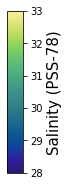

In [18]:
import matplotlib as mpl
fig = plt.figure(figsize=(.25, 15))
ax1 = fig.add_axes([0.05, 0.80, 0.9, 0.15])
cmap = cmocean.cm.haline
norm = mpl.colors.Normalize(vmin=28, vmax=33)
cb1 = mpl.colorbar.ColorbarBase(ax1, cmap=cmap,
                                norm=norm,
                                orientation='vertical')
cb1.set_label('Salinity (PSS-78)',fontsize=15)
cb1.ax.tick_params(labelsize=10)
plt.savefig("G:\My Drive\Research\Arctic EIS II\Saildrone\manuscript\Final\CoauthorComments\Submitted\Revisions\Resubmit\FromCoauthors\FinalRevised\ToUpload\Accepted\FinalFigures\svgs\FS1_cb1.svg",bbox_inches = "tight", transparent=True)

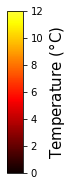

In [19]:
import matplotlib as mpl
import matplotlib.colors as colors
fig = plt.figure(figsize=(.25, 15))
ax1 = fig.add_axes([0.05, 0.80, 0.9, 0.15])

def truncate_colormap(cmap, minval=0.0, maxval=12.0, n=100):
    new_cmap = colors.LinearSegmentedColormap.from_list(
        'trunc({n},{a:.2f},{b:.2f})'.format(n=cmap.name, a=minval, b=maxval),
        cmap(np.linspace(minval, maxval, n)))
    return new_cmap

arr = np.linspace(0, 50, 100).reshape((10, 10))

cmap = plt.get_cmap('hot')
new_cmap = truncate_colormap(cmap, 0.0, 0.8)

norm = mpl.colors.Normalize(vmin=0, vmax=12)
cb1 = mpl.colorbar.ColorbarBase(ax1, cmap=new_cmap,
                                norm=norm,
                                orientation='vertical',
                                ticks=[0,2,4,6,8,10,12])
cb1.set_label('Temperature ($\degree$C)',fontsize=15)
cb1.ax.tick_params(labelsize=10)
plt.savefig("G:\My Drive\Research\Arctic EIS II\Saildrone\manuscript\Final\CoauthorComments\Submitted\Revisions\Resubmit\FromCoauthors\FinalRevised\ToUpload\Accepted\FinalFigures\svgs\FS1_cb2.svg",bbox_inches = "tight", transparent=True)

In [ ]:
plt.savefig("G:/My Drive/Research/Arctic EIS II/Saildrone/manuscript/Final/figsUnfiltered/Submitted/svg/test.svg")

## MWD Changes in the Repeat ML Surveys

In [10]:
dfEnvMLS1 = dfEnv1023[(dfEnv1023.dtime > '07-20-2018 20:00:00') & (dfEnv1023.dtime < '08-04-2018 00:00:00')]
dfEnvMLS1.name = 'MLS-1'
dfEnvMLS2 = dfEnv1022[(dfEnv1022.dtime > '07-23-2018 20:00:00') & (dfEnv1022.dtime < '08-13-2018 00:00:00')]
dfEnvMLS2.name = 'MLS-2'
dfEnvMLS3 = pd.concat([dfEnv1023[(dfEnv1023.dtime > '08-13-2018 15:00:00') & (dfEnv1023.dtime < '08-16-2018 20:00:00')], dfEnv1022[(dfEnv1022.dtime > '08-22-2018 00:00:00') & (dfEnv1022.dtime < '08-29-2018 00:00:00')]])
dfEnvMLS3.name = 'MLS-3'
dfEnvMLS4 = dfEnv1023[(dfEnv1023.dtime > '08-30-2018 20:00:00') & (dfEnv1023.dtime < '09-11-2018 17:00:00')]
dfEnvMLS4.name = 'MLS-4'

In [11]:
len(dfEnvMLS4.iloc[-168:][dfEnvMLS4.par <10])/len(dfEnvMLS4.iloc[-168:]) # How much was night vs day?

0.7142857142857143

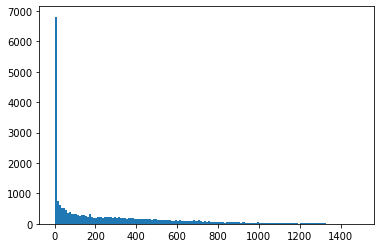

In [16]:
dfEnv = pd.read_csv('../../../data/Env/processed/Env1022.csv')
dfAcoustic = df1022
dfAll= combineEnvAcoustic(dfEnv, dfAcoustic)
cts = plt.hist(dfAll.par,bins=range(0,1500,10))

## Change in MWD with Light

t = -1.3637910562094013, p = 0.1735435665937346, mean =17.746295239751642  sem =0.28117088180848354  mean =16.685102921664914  sem =0.5692507279229633
t = -2.1947282491188984, p = 0.02866540529802794, mean =19.353896350880394  sem =0.30486006866213466  mean =17.83469157240621  sem =0.47649354745731803
t = -7.019250743317716, p = 2.5530703419588942e-11, mean =25.73957280531335  sem =0.5987752057158003  mean =18.830060895987046  sem =0.5622055951774
t = -15.146547905629475, p = 6.228272421547294e-38, mean =30.004327558883993  sem =0.43279564868678094  mean =19.697911531021088  sem =0.5341081797569339


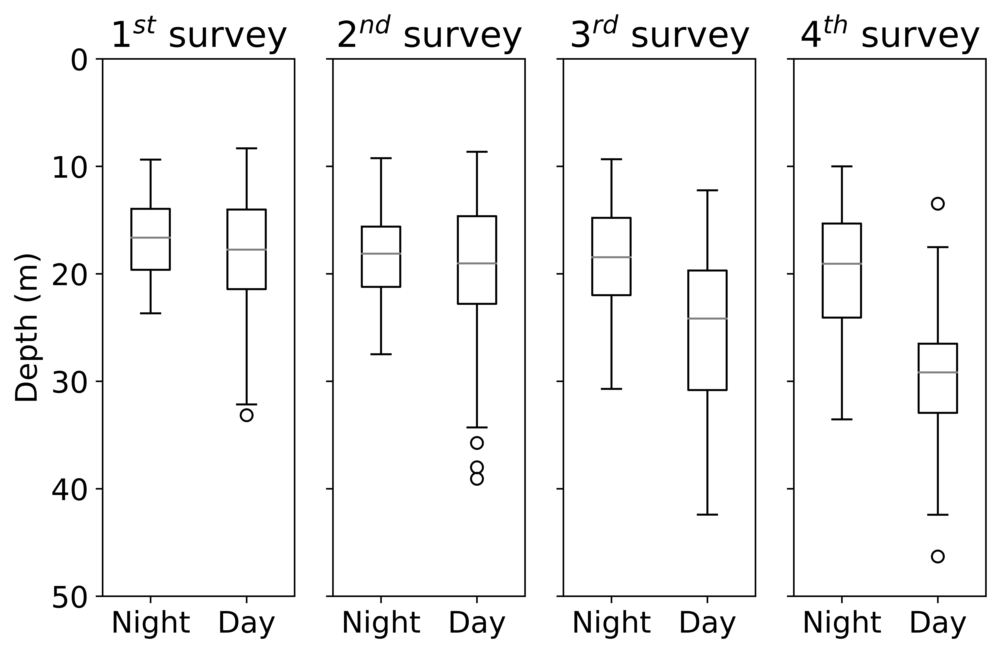

In [15]:
binWidth = 1
figure = plt.figure(figsize=(8,5),dpi=1200)
dfAcoustic = dfMLS1
dfEnv = dfEnvMLS1
df1022All= combineEnvAcoustic(dfEnv, dfAcoustic)
ax1 = plt.subplot(1,4,1)
test = df1022All.resample('H').mean()
t2, p2 = stats.ttest_ind(test[test.par <10].mwd,test[test.par >10].mwd)
print("t = " + str(t2)+", p = " + str(p2)+", mean ="+str(np.mean(test[test.par >10].mwd)), " sem ="+str(stats.sem(test[test.par >10].mwd)), " mean ="+str(np.mean(test[test.par <10].mwd)), " sem ="+str(stats.sem(test[test.par <10].mwd)))
ax1.boxplot([test[test.par <10].mwd,test[test.par >10].mwd],widths = (.4,.4),medianprops=dict(color='grey'))
ax1.set_xticklabels(['Night','Day'])
ax1.set_ylim([0,50])
ax1.set_title('1$^{st}$ survey')
ax1.set_ylabel('Depth (m)')
ax1.invert_yaxis()
dfAcoustic = dfMLS2
dfEnv = dfEnvMLS2
df1022All= combineEnvAcoustic(dfEnv, dfAcoustic)
ax2 = plt.subplot(1,4,2)
test = df1022All.resample('H').mean()
t2, p2 = stats.ttest_ind(test[test.par <10].mwd,test[test.par >10].mwd)
print("t = " + str(t2)+", p = " + str(p2)+", mean ="+str(np.mean(test[test.par >10].mwd)), " sem ="+str(stats.sem(test[test.par >10].mwd)), " mean ="+str(np.mean(test[test.par <10].mwd)), " sem ="+str(stats.sem(test[test.par <10].mwd)))
ax2.boxplot([test[test.par <10].mwd,test[test.par >10].mwd],widths = (.4,.4),medianprops=dict(color='grey'))
ax2.set_xticklabels(['Night','Day'])
ax2.set_ylim([0,50])
ax2.set_title('2$^{nd}$ survey')
ax2.yaxis.set_ticklabels([])
ax2.invert_yaxis()
dfAcoustic = dfMLS3
dfEnv = dfEnvMLS3
df1022All= combineEnvAcoustic(dfEnv, dfAcoustic)
ax3 = plt.subplot(1,4,3)
test = df1022All.resample('H').mean()
t2, p2 = stats.ttest_ind(test[test.par <10].mwd,test[test.par >10].mwd)
print("t = " + str(t2)+", p = " + str(p2)+", mean ="+str(np.mean(test[test.par >10].mwd)), " sem ="+str(stats.sem(test[test.par >10].mwd)), " mean ="+str(np.mean(test[test.par <10].mwd)), " sem ="+str(stats.sem(test[test.par <10].mwd)))
ax3.boxplot([test[test.par <10].mwd,test[test.par >10].mwd],widths = (.4,.4),medianprops=dict(color='grey'))
#ax3.plot([1.95,2.05],[7,7],'*k')
ax3.set_xticklabels(['Night','Day'])
ax3.set_ylim([0,50])
ax3.set_title('3$^{rd}$ survey')
ax3.yaxis.set_ticklabels([])
ax3.invert_yaxis()
dfAcoustic = dfMLS4
dfEnv = dfEnvMLS4
df1022All= combineEnvAcoustic(dfEnv, dfAcoustic)
ax4 = plt.subplot(1,4,4)
test = df1022All.resample('H').mean()
t2, p2 = stats.ttest_ind(test[test.par <10].mwd,test[test.par >10].mwd)
print("t = " + str(t2)+", p = " + str(p2)+", mean ="+str(np.mean(test[test.par >10].mwd)), " sem ="+str(stats.sem(test[test.par >10].mwd)), " mean ="+str(np.mean(test[test.par <10].mwd)), " sem ="+str(stats.sem(test[test.par <10].mwd)))
ax4.boxplot([test[test.par <10].mwd,test[test.par >10].mwd],widths = (.4,.4),medianprops=dict(color='grey'))
ax4.set_xticklabels(['Night','Day'])
ax4.yaxis.set_ticklabels([])
#ax4.plot([1.95,2.05],[7,7],'*k')
ax4.set_ylim([0,50])
ax4.set_title('4$^{th}$ survey')

plt.gca().invert_yaxis()
plt.savefig("G:\My Drive\Research\Arctic EIS II\Saildrone\manuscript\Final\CoauthorComments\Submitted\Revisions\Resubmit\FromCoauthors\FinalRevised\ToUpload\FinalFigures\svgs\F6_1.svg", bbox_inches="tight")

## Check that sA doesn't change with day/night
First for the small surveys, then the large scale one

([<matplotlib.axis.XTick at 0x23d35c64408>,
 [Text(0, 0, 'Night'), Text(0, 0, 'Day')])

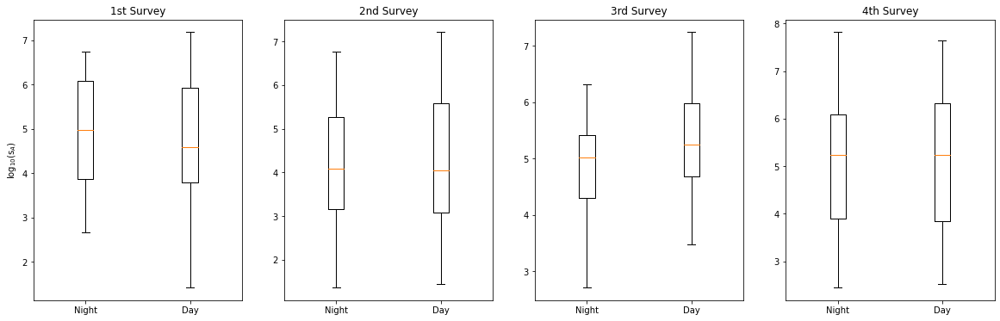

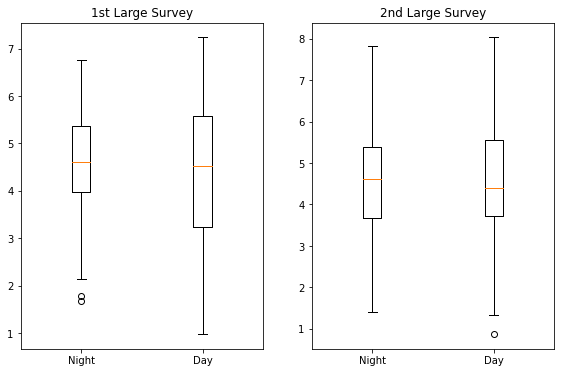

In [18]:
binWidth = 1
figure = plt.figure(figsize=(20,6))
df1022All=combineEnvAcoustic(dfEnvMLS1, dfMLS1)
plt.subplot(1,4,1)
test = df1022All.resample('H').mean()
plt.boxplot([np.log(test[test.par <10].nasc),np.log(test[test.par >10].nasc)])
plt.xticks([1,2], ['Night','Day'])
plt.ylabel('log$_{10}$(s$_{A}$)')
df1022All= combineEnvAcoustic(dfEnvMLS2, dfMLS2)
plt.title('1st Survey')
plt.subplot(1,4,2)
test = df1022All.resample('H').mean()
plt.boxplot([np.log(test[test.par <10].nasc),np.log(test[test.par >10].nasc)])
plt.xticks([1,2], ['Night','Day'])
df1022All= combineEnvAcoustic(dfEnvMLS3, dfMLS3)
plt.title('2nd Survey')
plt.subplot(1,4,3)
test = df1022All.resample('H').mean()
plt.boxplot([np.log(test[test.par <10].nasc),np.log(test[test.par >10].nasc)])
plt.xticks([1,2], ['Night','Day'])
df1022All= combineEnvAcoustic(dfEnvMLS4, dfMLS4)
plt.title('3rd Survey')
plt.subplot(1,4,4)
test = df1022All.resample('H').mean()
plt.boxplot([np.log(test[test.par <10].nasc),np.log(test[test.par >10].nasc)])
plt.xticks([1,2], ['Night','Day'])
plt.title('4th Survey')

figure = plt.figure(figsize=(20,6))
df1022All= combineEnvAcoustic(dfEnv1022, df1022)
plt.subplot(1,4,1)
plt.title('1st Large Survey')
test = df1022All.resample('H').mean()
plt.boxplot([np.log(test[test.par <5].nasc),np.log(test[test.par >5].nasc)])
plt.xticks([1,2], ['Night','Day'])
df1022All= combineEnvAcoustic(dfEnv1023, df1023)
plt.subplot(1,4,2)
plt.title('2nd Large Survey')
test = df1022All.resample('H').mean()
plt.boxplot([np.log(test[test.par <5].nasc),np.log(test[test.par >5].nasc)])
plt.xticks([1,2], ['Night','Day'])

We can check the stats to make sure that there is no difference between night and day

In [19]:
df1022All= combineEnvAcoustic(dfEnv1022, df1022)
test = df1022All.resample('H').mean()
t2, p2 = stats.ttest_ind(np.log(test[test.par <10].nasc),np.log(test[test.par >10].nasc))
print("1022: t = " + str(t2),"p = " + str(p2))
df1022All= combineEnvAcoustic(dfEnv1023, df1023)
test = df1022All.resample('H').mean()
t2, p2 = stats.ttest_ind(np.log(test[test.par <10].nasc),np.log(test[test.par >10].nasc))
print("1023: t = " + str(t2),"p = " + str(p2))

1022: t = 0.8727741306914443 p = 0.3829542256294356
1023: t = 0.38674473673855453 p = 0.6989953673651197


And if we combine 1022 and 1023 together...

In [20]:
df1022All= combineEnvAcoustic(dfEnv1022, df1022)
df1023All= combineEnvAcoustic(dfEnv1023, df1023)
dfAll = pd.concat([df1022All, df1023All])
test = dfAll.resample('H').mean()
t2, p2 = stats.ttest_ind(np.log(test[test.par <10].nasc),np.log(test[test.par >10].nasc))
print("p = ",p2)

p =  0.27050835766735026


# Wind
How many days had northerly winds?

In [26]:
allData = pd.concat([dfEnv1022.set_index(pd.to_datetime(dfEnv1022.dtime)),dfEnv1023.set_index(pd.to_datetime(dfEnv1023.dtime))])
allDataAug = allData[(allData.index >= '08-01-2018') & (allData.index < '09-01-2018') ]
allDataAug.vWind.resample('1D').mean() <0 #21 days of northerly winds
min10 = allDataAug.vWind.resample('10T').mean()
len(min10[min10 <=-7.2])/len(min10)

0.05600358422939068